In [1]:
from Detector.input_producer import InputProducer
from Detector.Textboxes_plusplus import RetinaNet
from utils.preprocess import *
import collections
import tensorflow as tf
import os
import numpy as np
os.environ["CUDA_VISIBLE_DEVICES"]=""

In [2]:
import cv2
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

VOC = {1 : "text"}
def draw_boxes(img, bboxes, classes):
    if len(bboxes) == 0:
        return img

    height, width, _ = img.shape
    image = Image.fromarray(img)
    font = ImageFont.truetype(
        font='/root/FiraMono-Medium.otf',
        size=np.floor(3e-2 * image.size[1] + 0.4).astype('int32'))

    thickness = (image.size[0] + image.size[1]) // 300
    draw = ImageDraw.Draw(image)

    for box, category in zip(bboxes, classes):
        y1, x1, y2, x2 = [int(i) for i in box]
        #x1, y1, x2, y2 = [int(i) for i in box]
        
        p1 = (x1, y1)
        p2 = (x2, y2)

        label = '{} '.format(category.title())
        label_size = draw.textsize(label)
        text_origin = np.array([p1[0], p1[1] - label_size[1]])

        color = np.array([0, 255, 0])
        for i in range(thickness):
            draw.rectangle(
                [p1[0] + i, p1[1] + i, p2[0] - i, p2[1] - i],
                outline=tuple(color))

        draw.rectangle(
            [tuple(text_origin),
             tuple(text_origin + label_size)],
            fill=tuple(color))

        draw.text(
            tuple(text_origin),
            label, fill=(0, 0, 0),
            font=font)

    del draw
    return np.array(image)

In [3]:
BBOX_CROP_OVERLAP = 0.3        # Minimum overlap to keep a bbox after cropping.
CROP_RATIO_RANGE = (0.8, 1.2)  # Distortion ratio during cropping.

def bboxes_resize(bbox_ref, bboxes, name=None):
    """Resize bounding boxes based on a reference bounding box,
    assuming that the latter is [0, 0, 1, 1] after transform. Useful for
    updating a collection of boxes after cropping an image.
    """
    # Bboxes is dictionary.
    if isinstance(bboxes, dict):
        with tf.name_scope(name, 'bboxes_resize_dict'):
            d_bboxes = {}
            for c in bboxes.keys():
                d_bboxes[c] = bboxes_resize(bbox_ref, bboxes[c])
            return d_bboxes

    # Tensors inputs.
    with tf.name_scope(name, 'bboxes_resize'):
        # Translate.
        v = tf.stack([bbox_ref[0], bbox_ref[1], bbox_ref[0], bbox_ref[1]])
        bboxes = bboxes - v
        # Scale.
        s = tf.stack([bbox_ref[2] - bbox_ref[0],
                      bbox_ref[3] - bbox_ref[1],
                      bbox_ref[2] - bbox_ref[0],
                      bbox_ref[3] - bbox_ref[1]])
        bboxes = bboxes / s
        return bboxes

    
def bboxes_intersection(bbox_ref, bboxes, name=None):
    """Compute relative intersection between a reference box and a
    collection of bounding boxes. Namely, compute the quotient between
    intersection area and box area.
    Args:
      bbox_ref: (N, 4) or (4,) Tensor with reference bounding box(es).
      bboxes: (N, 4) Tensor, collection of bounding boxes.
    Return:
      (N,) Tensor with relative intersection.
    """
    with tf.name_scope(name, 'bboxes_intersection'):
        # Should be more efficient to first transpose.
        bboxes = tf.transpose(bboxes)
        bbox_ref = tf.transpose(bbox_ref)
        # Intersection bbox and volume.
        int_ymin = tf.maximum(bboxes[0], bbox_ref[0])
        int_xmin = tf.maximum(bboxes[1], bbox_ref[1])
        int_ymax = tf.minimum(bboxes[2], bbox_ref[2])
        int_xmax = tf.minimum(bboxes[3], bbox_ref[3])
        h = tf.maximum(int_ymax - int_ymin, 0.)
        w = tf.maximum(int_xmax - int_xmin, 0.)
        # Volumes.
        inter_vol = h * w
        bboxes_vol = (bboxes[2] - bboxes[0]) * (bboxes[3] - bboxes[1])
        #scores = tfe_math.safe_divide(inter_vol, bboxes_vol, 'intersection')
        scores = inter_vol / bboxes_vol
        return scores
    
def bboxes_filter_overlap(labels, bboxes, threshold=0.5,
                          scope=None):
    """Filter out bounding boxes based on overlap with reference
    box [0, 0, 1, 1].
    Return:
      labels, bboxes: Filtered elements.
    """
    with tf.name_scope(scope, 'bboxes_filter', [labels, bboxes]):
        scores = bboxes_intersection(tf.constant([0, 0, 1, 1], bboxes.dtype),
                                     bboxes)
        mask = scores > threshold
        labels = tf.boolean_mask(labels, mask)
        bboxes = tf.boolean_mask(bboxes, mask)
        return labels, bboxes
    
def distorted_bounding_box_crop(image,
                                labels,
                                bboxes,
                                min_object_covered=0.05,
                                aspect_ratio_range=(0.9, 1.1),
                                area_range=(0.1, 1.0),
                                max_attempts=200,
                                scope=None):
    """Generates cropped_image using a one of the bboxes randomly distorted.
    See `tf.image.sample_distorted_bounding_box` for more documentation.
    Args:
        image: 3-D Tensor of image (it will be converted to floats in [0, 1]).
        bbox: 3-D float Tensor of bounding boxes arranged [1, num_boxes, coords]
            where each coordinate is [0, 1) and the coordinates are arranged
            as [ymin, xmin, ymax, xmax]. If num_boxes is 0 then it would use the whole
            image.
        min_object_covered: An optional `float`. Defaults to `0.1`. The cropped
            area of the image must contain at least this fraction of any bounding box
            supplied.
        aspect_ratio_range: An optional list of `floats`. The cropped area of the
            image must have an aspect ratio = width / height within this range.
        area_range: An optional list of `floats`. The cropped area of the image
            must contain a fraction of the supplied image within in this range.
        max_attempts: An optional `int`. Number of attempts at generating a cropped
            region of the image of the specified constraints. After `max_attempts`
            failures, return the entire image.
        scope: Optional scope for name_scope.
    Returns:
        A tuple, a 3-D Tensor cropped_image and the distorted bbox
    """
    bboxes = tf.clip_by_value(bboxes, 0.0, 1.0)

    with tf.name_scope(scope, 'distorted_bounding_box_crop', [image, bboxes]):
        # Each bounding box has shape [1, num_boxes, box coords] and
        # the coordinates are ordered [ymin, xmin, ymax, xmax].
        bbox_begin, bbox_size, distort_bbox = tf.image.sample_distorted_bounding_box(
                tf.shape(image),
                bounding_boxes=tf.expand_dims(bboxes, 0),
                min_object_covered=min_object_covered,
                aspect_ratio_range=aspect_ratio_range,
                area_range=area_range,
                max_attempts=max_attempts,
                use_image_if_no_bounding_boxes=True)
        distort_bbox = distort_bbox[0, 0]

        # Crop the image to the specified bounding box.
        cropped_image = tf.slice(image, bbox_begin, bbox_size)
        # Restore the shape since the dynamic slice loses 3rd dimension.
        cropped_image.set_shape([None, None, 3])

        # Update bounding boxes: resize and filter out.
        bboxes = bboxes_resize(distort_bbox, bboxes)
        labels, bboxes = bboxes_filter_overlap(labels, bboxes, BBOX_CROP_OVERLAP )
        
        bboxes = tf.clip_by_value(bboxes, 0.0, 1.0)

        return cropped_image, labels, bboxes, distort_bbox

In [5]:
slim = tf.contrib.slim

input_features = []

InputFeatures = collections.namedtuple('InputFeatures', ('image', 'loc', 'cls'))
input_producer = InputProducer()

split_name = 'train_quad'

dataset = input_producer.get_split(split_name, '/root/DB/SynthText/train/tfrecord/', False)
#dataset = input_producer.get_split(split_name, '/root/DB/ICDAR2013_FOCUSED/tfrecord/')

provider = slim.dataset_data_provider.DatasetDataProvider(
                dataset,
                num_readers=4,
                common_queue_capacity=80,
                common_queue_min=40,
                shuffle=True)

_images, _quad1, _quad2, _labels = provider.get(['image', 'object/quad1', 'object/quad2', 'object/label'])
_bboxes = tf.concat([_quad1, _quad2], axis=1) # 8-points QUAD


#dst_image, dst_labels, dst_bboxes, distort_bbox = distorted_bounding_box_crop(_image, _labels, _bboxes, aspect_ratio_range=CROP_RATIO_RANGE)

#no_box = tf.equal(tf.shape(dst_bboxes)[0], 0) # If there is no box in the image, it returns the original image.
#image, bboxes, labels = tf.cond(no_box, lambda:(_image, _bboxes, _labels), lambda:(dst_image, dst_bboxes,  dst_labels))


(10, 8)


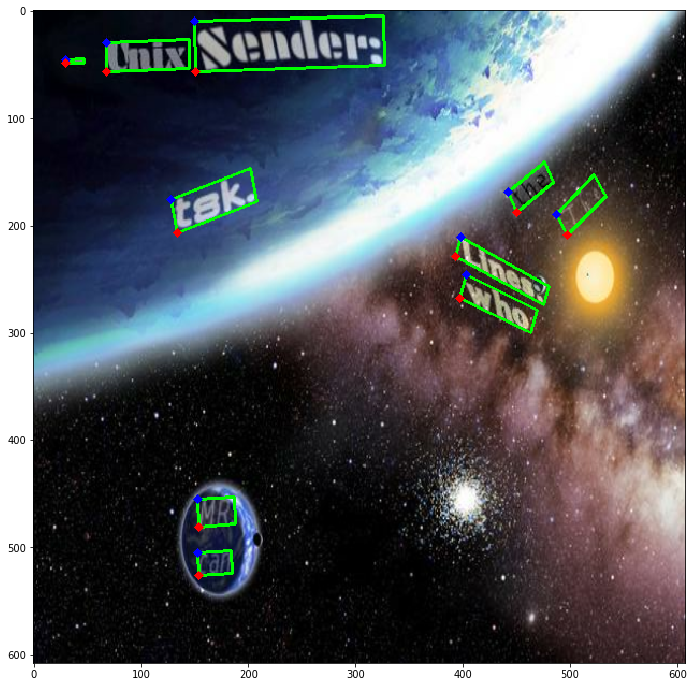

(8, 8)


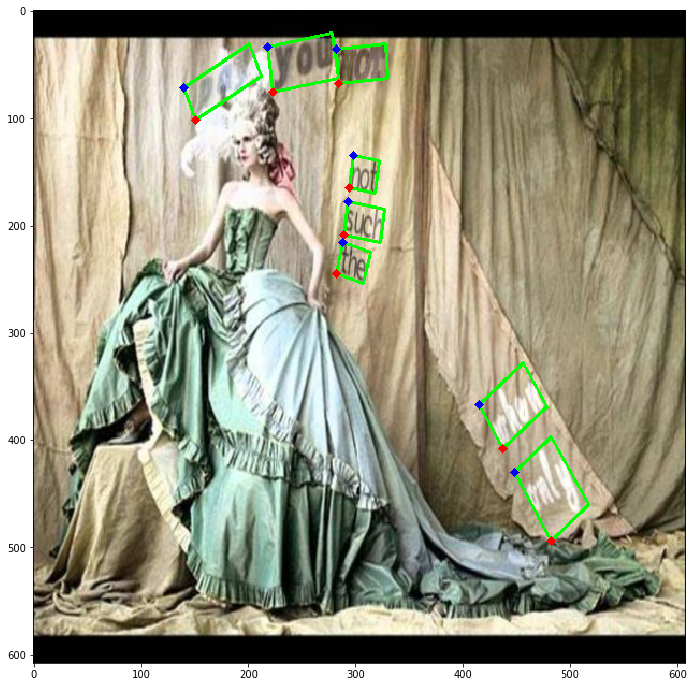

(6, 8)


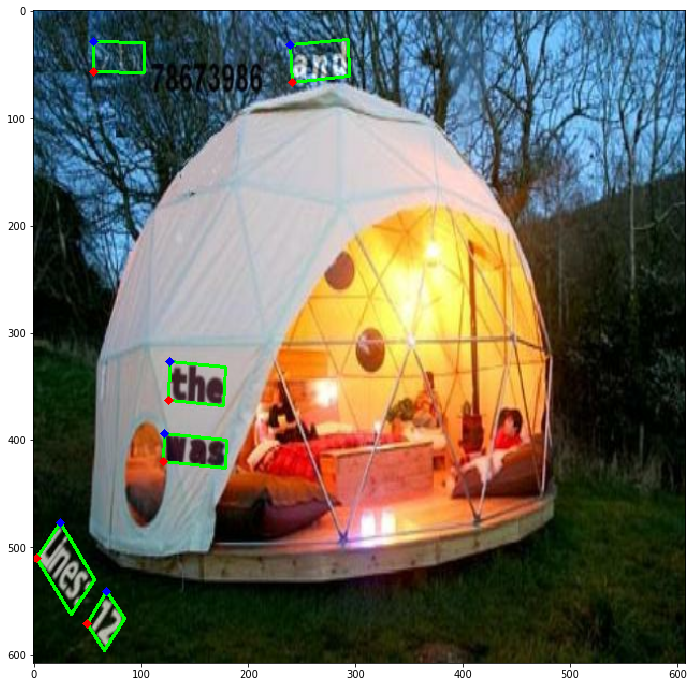

(8, 8)


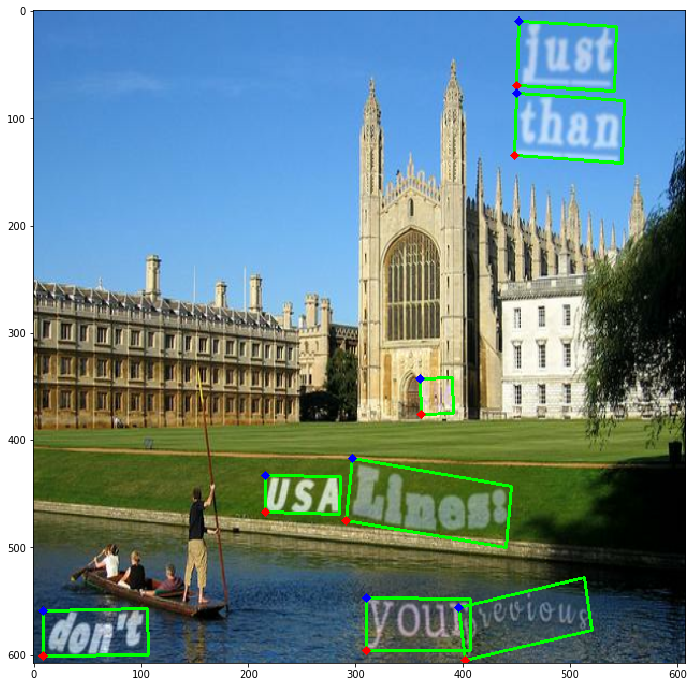

(8, 8)


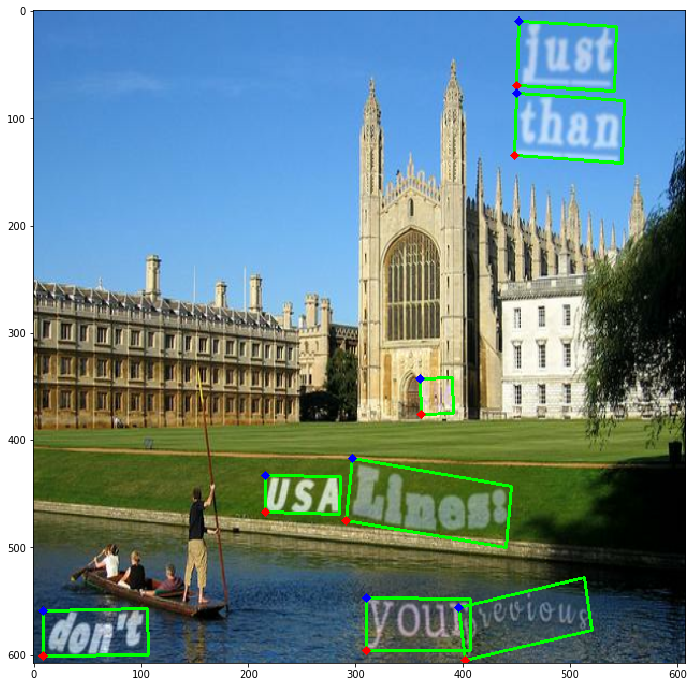

(19, 8)


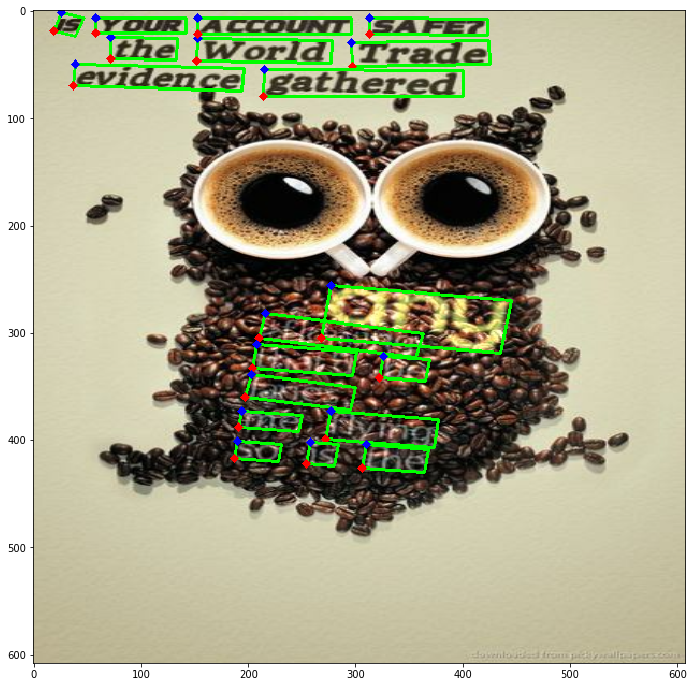

(5, 8)


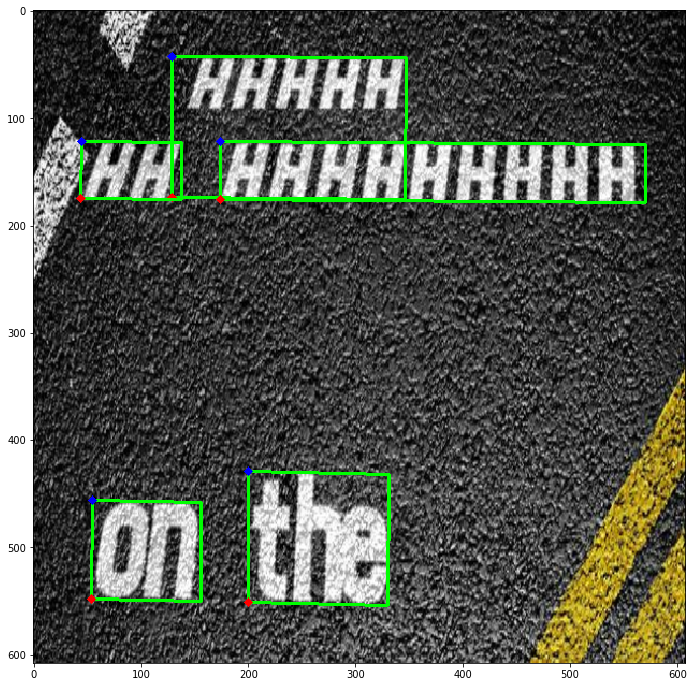

(4, 8)


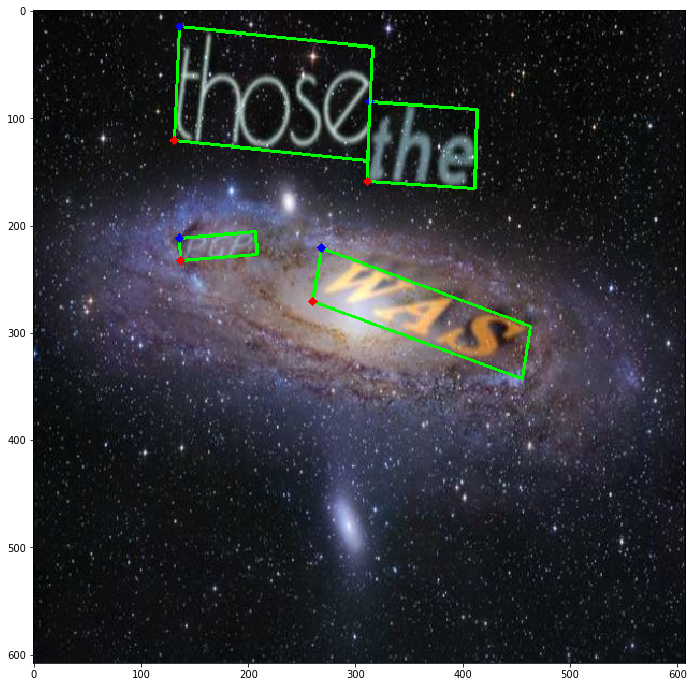

(8, 8)


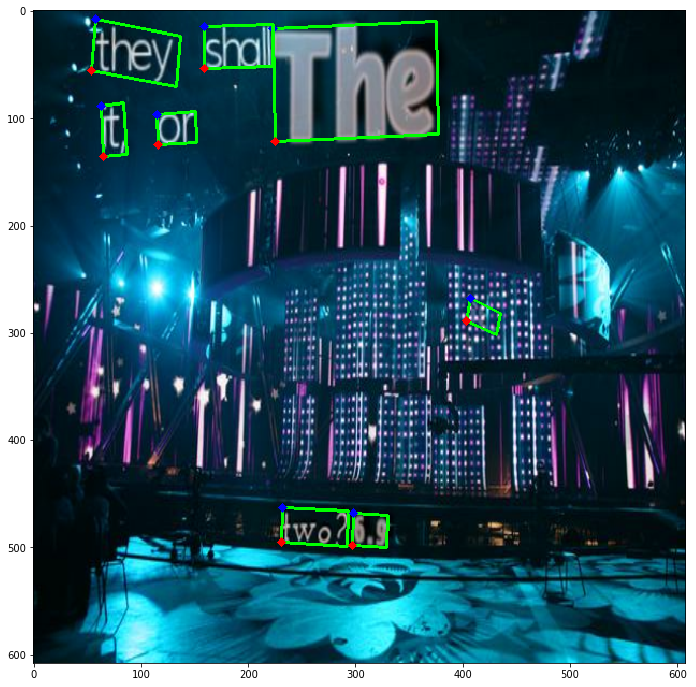

(9, 8)


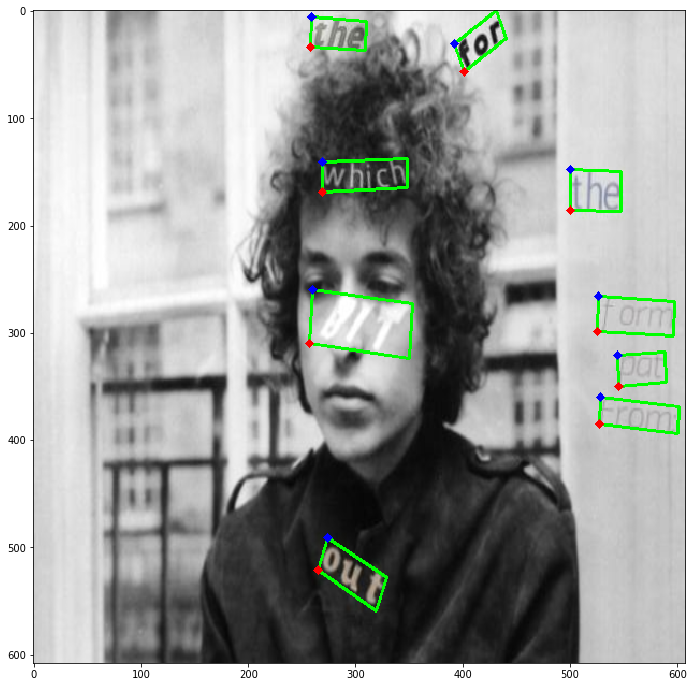

(4, 8)


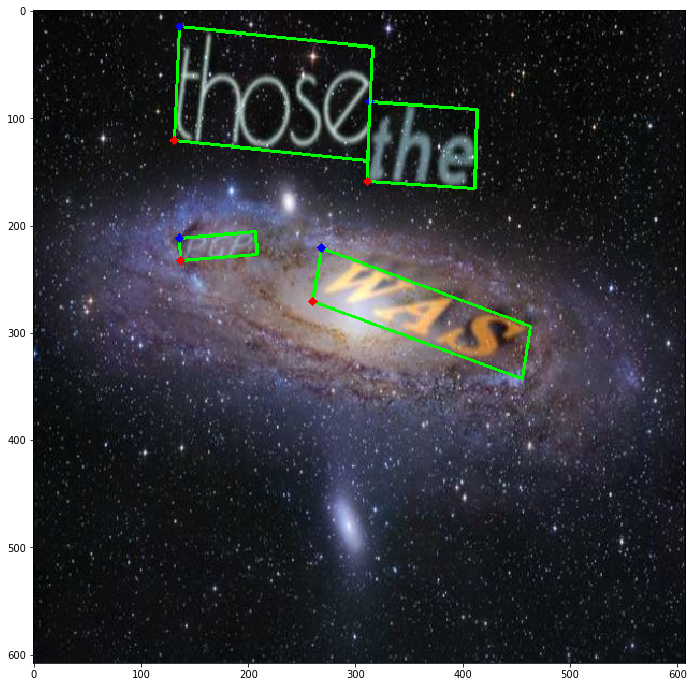

(6, 8)


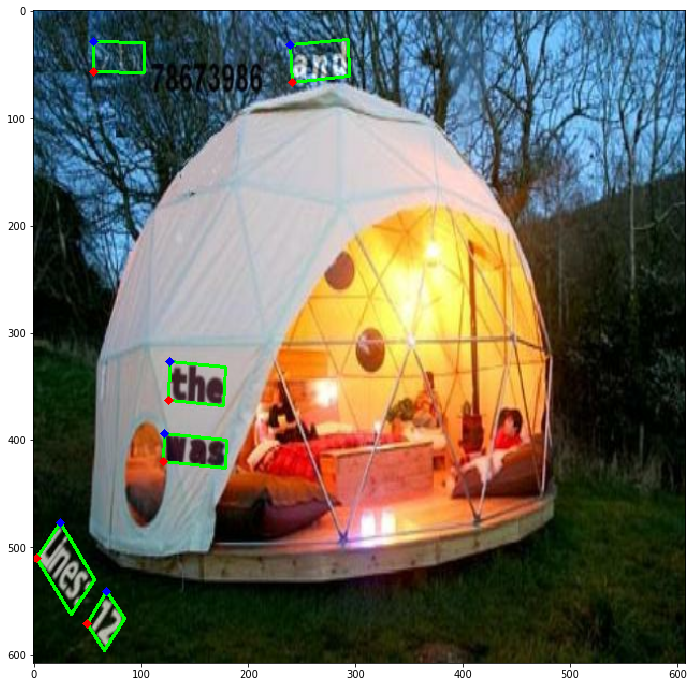

(5, 8)


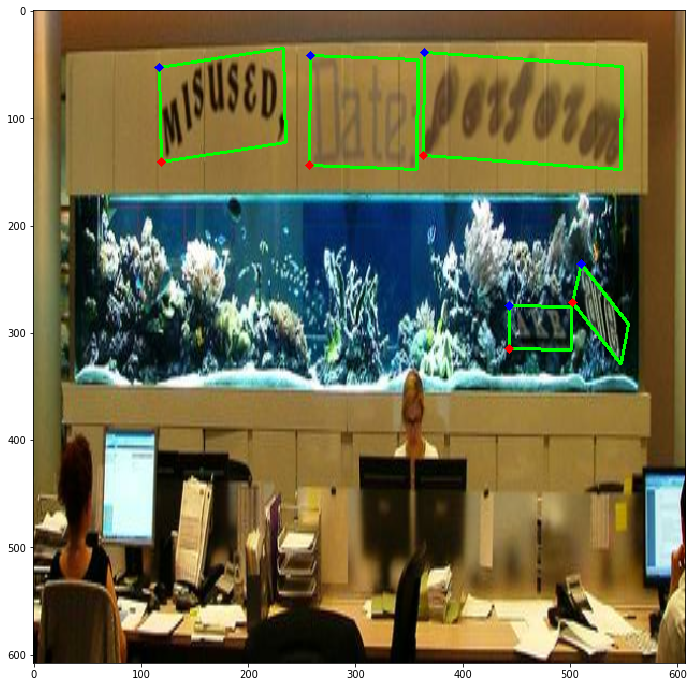

(16, 8)


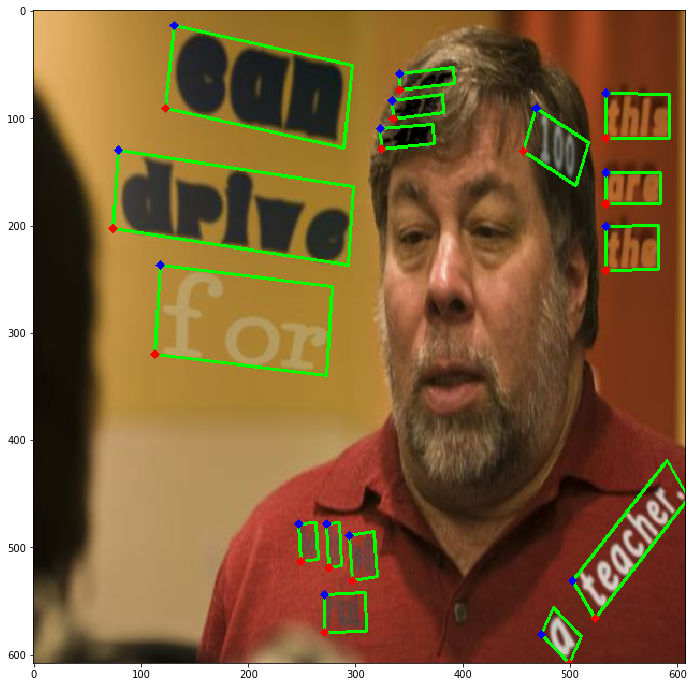

(5, 8)


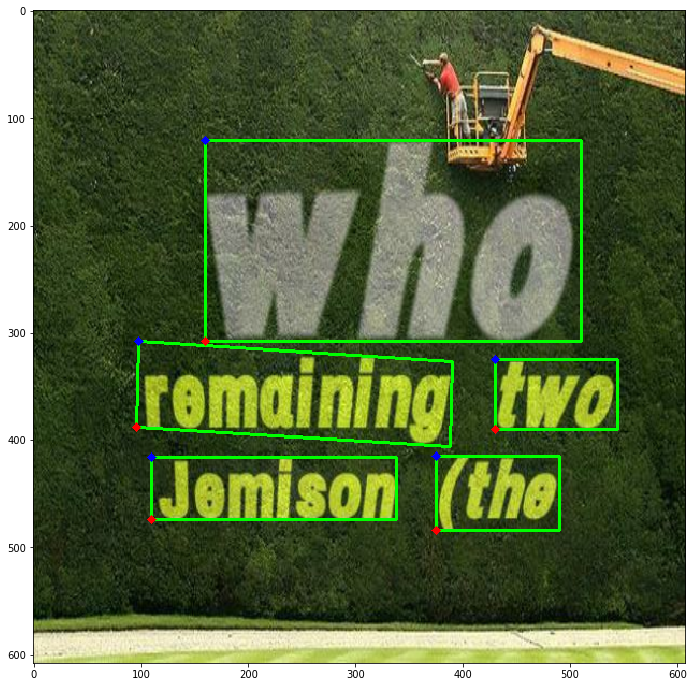

(4, 8)


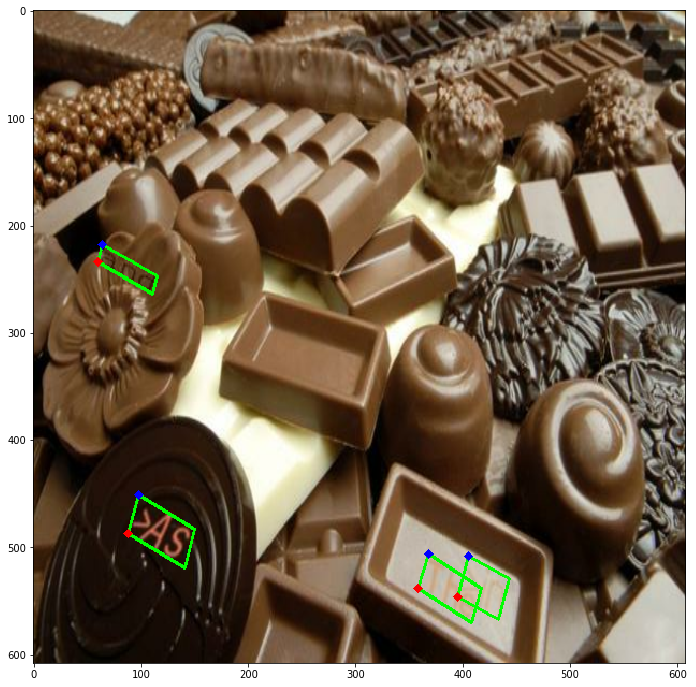

(2, 8)


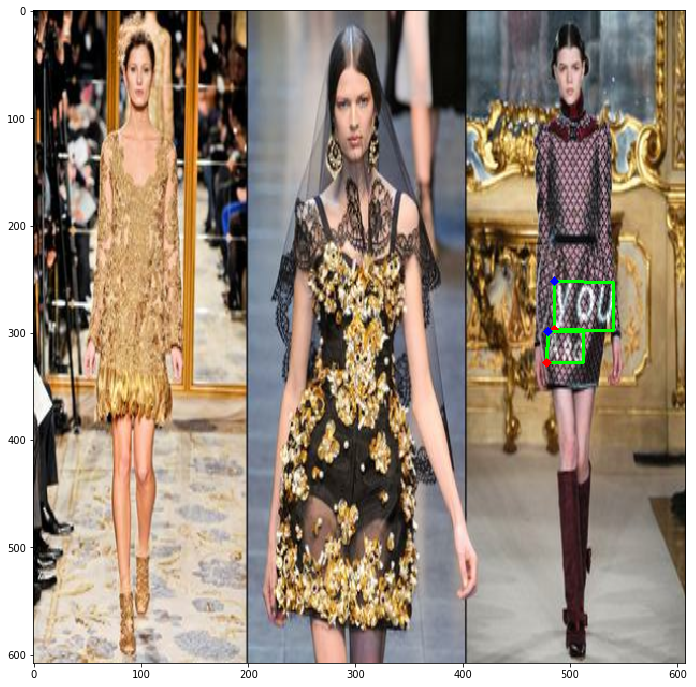

(11, 8)


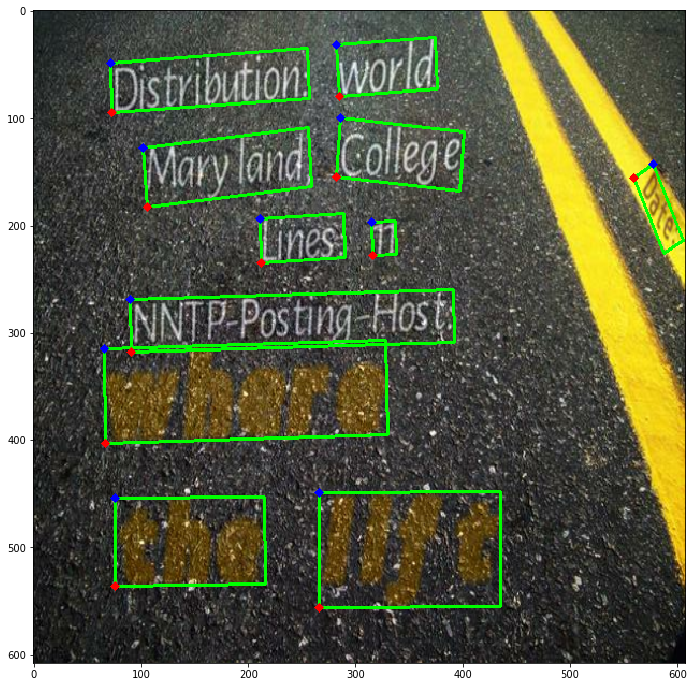

(5, 8)


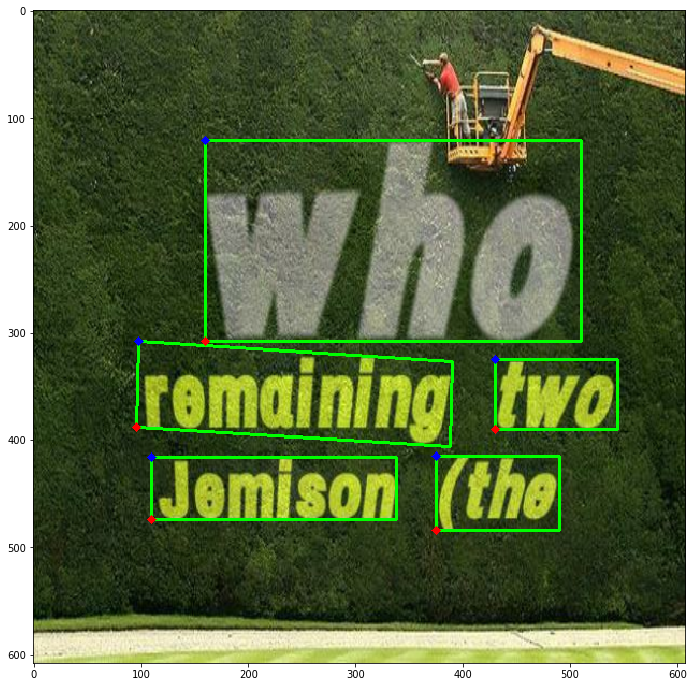

(6, 8)


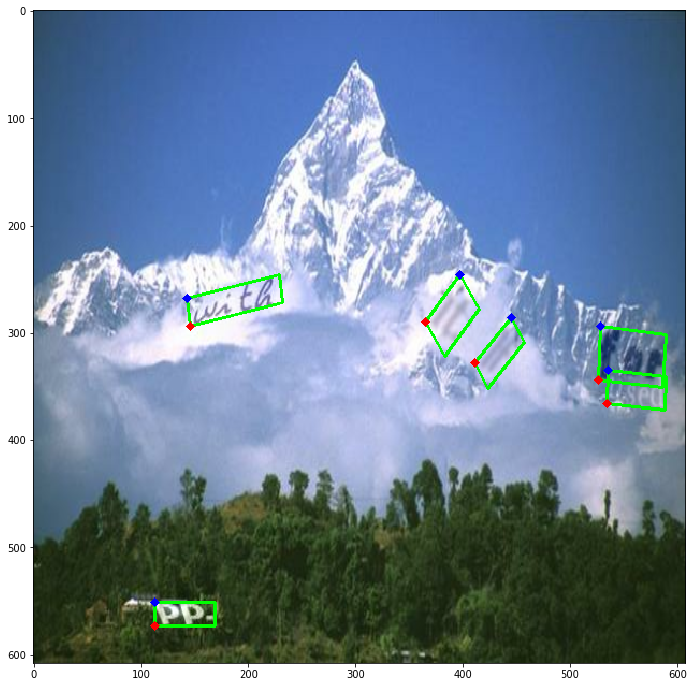

In [17]:
with tf.Session() as sess:
    with slim.queues.QueueRunners(sess):
        for i in range(20):
            np_image, np_bbox, np_label = sess.run([_images, _bboxes, _labels])
            #np_image, np_bbox, np_label = sess.run([image, bboxes, labels])
            
            np_image = cv2.resize(np_image, (608, 608))
            np_bbox = (np_bbox * 608).astype(np.int32)
            
            for box in np_bbox:
                y0, x0, y1, x1, y2, x2, y3, x3 = box
                new_box = np.array([x0, y0, x1, y1, x2, y2, x3, y3])
                new_box = new_box.reshape([4, 2])
                
                np_image =  cv2.polylines(np_image, [new_box], True, (0, 255, 0), 2)    
                
                np_image = cv2.circle(np_image, (x0, y0), 2, (0,0,255), 3)
                np_image = cv2.circle(np_image, (x3, y3), 2, (255,0,0), 3)
            
            print(np_bbox.shape)
            figure(figsize = (12,12))
            plt.imshow(np_image)
            plt.show()